# Statistical Analysis of IMD Metrics

### Import Packages

In [1]:
# import packages
import pandas as pd, numpy as np, matplotlib.pyplot as plt, geopandas as gpd, datetime, glob, math, openpyxl
import matplotlib.pyplot as plt, matplotlib.dates as mdates
from statistics import mean
from scipy import stats
from sklearn import datasets, linear_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import TweedieRegressor

plt.rcParams['figure.dpi'] = 300

In [2]:
# import packages
import seaborn as sns; sns.set_theme(color_codes=True)

### Import and Label Data

In [3]:
# set the filepath and load in a shapefile
fp = "./output_test.shp"
merged = gpd.read_file(fp)

In [4]:
# what are the column names of the input files?
merged.columns

Index(['LAD21NM', 'OBJECTID', 'LAD21CD', 'BNG_E', 'BNG_N', 'LONG', 'LAT',
       'Shape__Are', 'Shape__Len', 'area code', 'Cumulative', 'IMD_ Overa',
       'IMD_ Barri', 'IMD_ Crime', 'IMD_ Educa', 'IMD_ Emplo', 'IMD_ Healt',
       'IMD_ Incom', 'IMD_ Livin', 'Cumulati_1', 'Cumulati_2', 'Total popu',
       'Cumulati_3', 'Cumulati_4', 'Cumulati_5', 'IMD_ Ove_1', 'Cumulati_6',
       'Cumulati_7', 'IMD_ Ove_2', 'Cumulati_8', 'IMD_ Ove_3', 'IMD_ Ove_4',
       'geometry'],
      dtype='object')

In [5]:
# give the columns more appropriate names
merged.columns = ['LAD21NM', 'OBJECTID', 'LAD21CD', 'BNG_E', 'BNG_N', 'LONG', 'LAT', 'Shape__Are','Shape__Len', 
                  'area code', 'Cumulative confirmed cases', 
                  'IMD: Overall - extent (%)',
                  'IMD: Barriers to Housing and Services',
                  'IMD: Crime',
                  'IMD: Education Skills and Training Deprivation',
                  'IMD: Employment',
                  'IMD: Health Deprivation and Disability',
                  'IMD: Income Deprivation',
                  'IMD: Living Environment Deprivation',
                  'Cumulative 1st dose', 'Cumulative 2nd dose','Total population', 
                  'Cumulative 1st dose per 100k', 'Cumulative 2nd dose per 100k', 
                  'Cumulative confirmed cases per 100k','IMD: Overall - extent (%) per 100k', 
                  'Cumulative 1st dose by Cumulative 2nd dose','Cumulative 1st dose by Cumulative confirmed cases', 
                  'IMD: Overall - extent (%) by Cumulative 1st dose', 
                  'Cumulative 2nd dose by Cumulative confirmed cases', 
                  'IMD: Overall - extent (%) by Cumulative 2nd dose', 
                  'IMD: Overall - extent (%) by Cumulative confirmed cases', 'geometry']
merged = merged.set_index('LAD21NM')

In [6]:
# remove nans
merged = merged.dropna()

In [7]:
# only consider columns that start wth IMD
IMD_df = merged[merged.columns[merged.columns.str.startswith('IMD')]]

# remove any columns that contain '%', mainly 'IMD: Overall - extent (%)'
IMD_metrics_df = IMD_df[IMD_df.columns[~IMD_df.columns.str.contains('\%')]]

In [8]:
# compute the variance for each IMD metric and put them in a list in the form, (IMD metric name, IMD metric variance).
IMD_metric_variances = []

for i,col in enumerate(IMD_metrics_df.columns):
    IMD_metric_variances.append((col,IMD_metrics_df.iloc[:,i].var()))

In [9]:
# sort the variances from largest to smallest
IMD_metric_variances = sorted(IMD_metric_variances, key=lambda tup: tup[1])

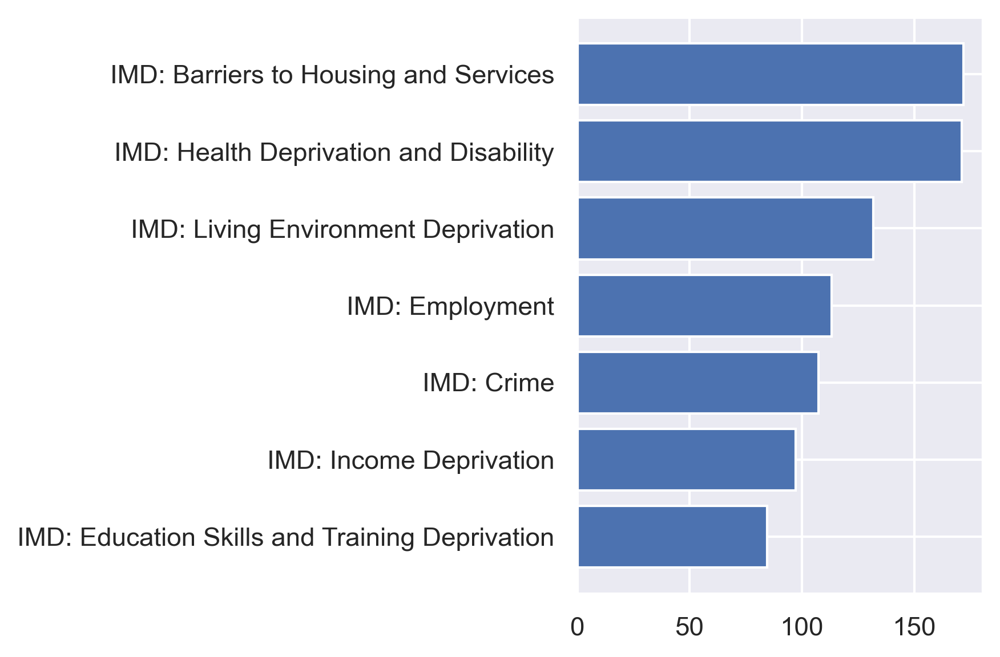

In [10]:
# plot the variances
title = '6.09. Variances of IMD metrics stratified by local authority'

labels = [tup[0] for tup in IMD_metric_variances]
scores = [tup[1] for tup in IMD_metric_variances]

plt.barh(y=labels,width=scores)

#plt.title(title)
plt.tight_layout()
plt.savefig('./Desktop/MSc Project/Outputs/' + title + '.png')
plt.show()

In [11]:
# more drop nans for some reason
IMD_metrics_df = IMD_metrics_df.dropna()
IMD_metrics_df.head(3)

,IMD: Barriers to Housing and Services,IMD: Crime,IMD: Education Skills and Training Deprivation,IMD: Employment,IMD: Health Deprivation and Disability,IMD: Income Deprivation,IMD: Living Environment Deprivation
LAD21NM,,,,,,,
Hartlepool,0.0,32.76,20.69,43.10,36.21,37.93,0.00
Middlesbrough,0.0,45.35,39.53,48.84,56.98,50.00,0.00
Redcar and Cleveland,0.0,13.64,19.32,32.95,35.23,26.14,1.14


### Add Age and Ethnicity

Add columns of Median and Mean age per LTLA. Add columns for the five major ethnic groups in England.

In [12]:
# load age and ethnicity data from ONS
path = 'C:/Users/joshb/Desktop/MSc Project/Data/'
age_df = pd.read_csv(path + 'Age_by_LA.csv')
ethni_df = pd.read_csv(path + 'Ethnicity_by_LA.csv')

In [13]:
# only consider age columns we care about
age_df = age_df[['geography', 'Age: Mean Age; Rural Urban: Total; measures: Value', 'Age: Median Age; Rural Urban: Total; measures: Value']]

# give columns appropriate name
age_df = age_df.rename(columns={'geography': 'area name',
                   'Age: Mean Age; Rural Urban: Total; measures: Value': 'mean age', 
                   'Age: Median Age; Rural Urban: Total; measures: Value': 'median age'})

# set index to LTLA names
age_df = age_df.set_index('area name')
age_df.head(2)

,mean age,median age
area name,,
Hartlepool,39.8,40
Middlesbrough,37.8,37


---

In [14]:
# rename ethnicity columns to 'simpler' names
ethni_df = ethni_df.rename(
    columns={'geography': 'area name', 
             'Ethnic Group: All categories: Ethnic group; measures: Value': 'all ethnic groups', 
             'Ethnic Group: White; measures: Value': 'white british',
             'Ethnic Group: Mixed / Multiple ethnic group; measures: Value': 'multiple ethnic group',
             'Ethnic Group: Black / African / Caribbean / Black British; measures: Value': 'Black British',
             'Ethnic Group: Other Ethnic Group; measures: Value': 'Other Ethnic Group'})

In [15]:
# aggregate 'Asian British' columns
ethni_df['Asian British'] = ethni_df[
    ethni_df.columns[ethni_df.columns.str.contains('Asian')]].sum(axis=1)

In [16]:
# only consider the columns we care about
ethni_df = ethni_df[['area name',
             'white british',
             'multiple ethnic group',
             'Black British', 
             'Other Ethnic Group',
             'Asian British']]

# set index to LTLA names
ethni_df = ethni_df.set_index('area name')
ethni_df.head(2)

,white british,multiple ethnic group,Black British,Other Ethnic Group,Asian British
area name,,,,,
Hartlepool,89859,550,170,105,1304
Middlesbrough,121970,2362,1731,1496,10768


In [17]:
# change data type to float64 for future calculations
ethni_df = ethni_df.astype('float64')

In [18]:
# add a population column
ethni_df = pd.concat([ethni_df,merged['Total population']],axis=1,join='inner')
ethni_df.head(2)

,white british,multiple ethnic group,Black British,Other Ethnic Group,Asian British,Total population
Hartlepool,89859.0,550.0,170.0,105.0,1304.0,98013.0
Middlesbrough,121970.0,2362.0,1731.0,1496.0,10768.0,161493.0


In [19]:
# divide each column elementwise by the 'Total population' column
ethnicity_df = ethni_df.iloc[:,:-1].div(ethni_df['Total population'].values,axis=0)

In [20]:
# put the IMD, age and ethnicity data frames into one big dataframe
imd_age_ethnicity_df = pd.concat([IMD_metrics_df,age_df,ethnicity_df],join='inner',axis=1)
imd_age_ethnicity_df.head()

,IMD: Barriers to Housing and Services,IMD: Crime,IMD: Education Skills and Training Deprivation,IMD: Employment,IMD: Health Deprivation and Disability,IMD: Income Deprivation,IMD: Living Environment Deprivation,mean age,median age,white british,multiple ethnic group,Black British,Other Ethnic Group,Asian British
Hartlepool,0.00,32.76,20.69,43.10,36.21,37.93,0.00,39.8,40,0.916807,0.005612,0.001734,0.001071,0.013304
Middlesbrough,0.00,45.35,39.53,48.84,56.98,50.00,0.00,37.8,37,0.755265,0.014626,0.010719,0.009264,0.066678
Redcar and Cleveland,0.00,13.64,19.32,32.95,35.23,26.14,1.14,41.5,43,0.933408,0.005981,0.000855,0.000912,0.006093
Stockton-on-Tees,1.67,10.00,16.67,20.83,28.33,21.67,0.00,39.1,39,0.875598,0.009652,0.005476,0.002654,0.032055
Darlington,3.08,29.23,20.00,18.46,24.62,18.46,0.00,40.2,41,0.888200,0.010054,0.003132,0.002290,0.019344


### Anova

In [21]:
# some more formatting for next step
a = IMD_metrics_df.iloc[:,0].values
b = IMD_metrics_df.iloc[:,1].values
c = IMD_metrics_df.iloc[:,2].values
d = IMD_metrics_df.iloc[:,3].values
e = IMD_metrics_df.iloc[:,4].values
f = IMD_metrics_df.iloc[:,5].values
g = IMD_metrics_df.iloc[:,6].values

In [22]:
# 'The one-way ANOVA tests the null hypothesis that two or more groups have the same population mean. 
# The test is applied to samples from two or more groups, possibly with differing sizes.'
F, p = stats.f_oneway(a,b,c,d,e,f,g)

In [23]:
F

1.9003915577822814

This larger F value means that the groups probably do have different means. (the variation between groups is larger than the variation within groups.)

In [24]:
p

0.07724946774970076

This low p-value shows that this result is statistically significant.

Therefore there is a significant difference between IMD metrics.

# Histograms of IMD Metrics

C:\Users\joshb\AppData\Roaming\Python\Python38\site-packages\pandas\plotting\_matplotlib\tools.py:331: MatplotlibDeprecationWarning: 
The is_first_col function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use ax.get_subplotspec().is_first_col() instead.
  if ax.is_first_col():


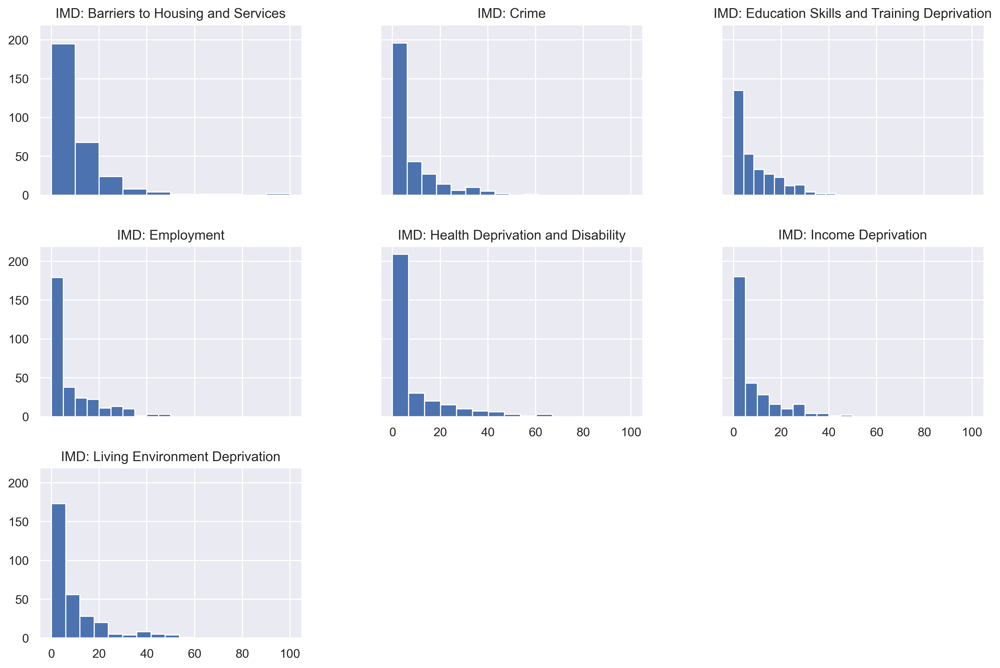

In [25]:
# plot histograms of the IMD metrics to explore variance
title = '6.09. Histograms of IMD metrics stratified by local authority'

IMD_metrics_df.hist(figsize=(15,10),sharex=True,sharey=True)

plt.title(title)
plt.savefig('./Desktop/MSc Project/Outputs/' + title + '.png')
plt.show()

# Linear Regression Models [Number of Doses per 100k]

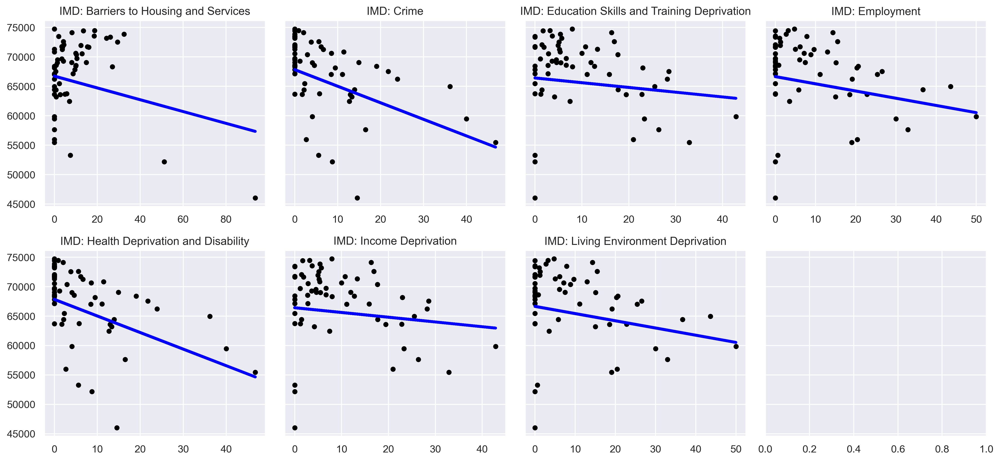

(None, None)

In [26]:
# perform linear regression on each IMD metric individually and plot
# outcome variable being number of doses per 100k
rows,cols=2,4
title = '6.09. Linear Regression of Vaccine Rates per 100k and IMD Metrics'

fig, axes = plt.subplots(figsize=(15,7),nrows=rows, ncols=cols, sharey=True)

for i in range(rows):
    for j in range(cols):
        if i*j==3:
            continue
        else:
            # Load the dataset
            X,y = IMD_metrics_df.iloc[:,i+j],merged['Cumulative 1st dose per 100k']

            # Split the dataset into training, validation and test, using test_size=0.2
            Xtrain, Xtest, ytrain, ytest = train_test_split(X.values, y.values, test_size=0.2, random_state=0)
            regr = linear_model.LinearRegression()

            # Train the model using the training sets
            Xtrain,Xtest = Xtrain.reshape(-1, 1),Xtest.reshape(-1, 1)
            regr.fit(Xtrain, ytrain)

            # Make predictions using the testing set
            pred = regr.predict(Xtest)

            # The coefficients
            #print('Coefficients: \n', regr.coef_)

            # The mean squared error
            #print('Mean squared error: %.2f'
            #      % mean_squared_error(ytest, pred))

            # The coefficient of determination: 1 is perfect prediction
            #print('Coefficient of determination: %.2f'
            #      % r2_score(ytest, pred))

            # Plot outputs
            axes[i][j].scatter(Xtest, ytest,  color='black', s=20)
            axes[i][j].plot(Xtest, pred, color='blue', linewidth=3)
            axes[i][j].set_title(IMD_metrics_df.iloc[:,(i*4)+j].name)
        
#fig.suptitle(title)
plt.savefig('./Desktop/MSc Project/Outputs/' + title + '.png')
plt.tight_layout(),plt.show()

# Linear Regression Models [Hesitancy Measure]

In [27]:
# Load the dataset
fp = "./hesitancy_by_imd_df_file.csv"
hesitancy_by_imd_df = pd.read_csv(fp,index_col=0)
hesitancy_by_imd_df = hesitancy_by_imd_df.dropna()

In [28]:
# put the IMD/hesitancy, age and ethnicity data frames into one big dataframe
imd_hesitancy_age_ethnicity_df = pd.concat([hesitancy_by_imd_df,age_df,ethnicity_df],join='inner',axis=1)

In [29]:
# reorder columns ('hesistancy measure' at the end)
imd_hesitancy_age_ethnicity_df = imd_hesitancy_age_ethnicity_df[
    [col for col in imd_hesitancy_age_ethnicity_df if col not in ['hesitancy measure']]  + ['hesitancy measure']]
imd_hesitancy_age_ethnicity_df.head(2)

,IMD: Overall - extent (%),IMD: Barriers to Housing and Services,IMD: Crime,IMD: Education Skills and Training Deprivation,IMD: Employment,IMD: Health Deprivation and Disability,IMD: Income Deprivation,IMD: Living Environment Deprivation,mean age,median age,white british,multiple ethnic group,Black British,Other Ethnic Group,Asian British,hesitancy measure
Adur,7.9,0.00,0.0,7.14,0.00,0.00,0.0,0.00,43.0,44,0.869350,0.013157,0.004648,0.003891,0.015711,0.690059
Allerdale,19.9,13.33,0.0,18.33,13.33,11.67,10.0,21.67,43.1,45,0.950848,0.004247,0.000728,0.000608,0.004756,0.721900


IMD: Overall - extent (%)
Mean squared error: 0.0060
Coefficient of determination: 0.10
IMD: Barriers to Housing and Services
Mean squared error: 0.0071
Coefficient of determination: -0.08
IMD: Crime
Mean squared error: 0.0063
Coefficient of determination: 0.05
IMD: Education Skills and Training Deprivation
Mean squared error: 0.0075
Coefficient of determination: -0.13
IMD: Employment
Mean squared error: 0.0077
Coefficient of determination: -0.17
IMD: Health Deprivation and Disability
Mean squared error: 0.0076
Coefficient of determination: -0.15
IMD: Income Deprivation
Mean squared error: 0.0070
Coefficient of determination: -0.05
IMD: Living Environment Deprivation
Mean squared error: 0.0074
Coefficient of determination: -0.11
mean age
Mean squared error: 0.0013
Coefficient of determination: 0.81
median age
Mean squared error: 0.0013
Coefficient of determination: 0.81
white british
Mean squared error: 0.0013
Coefficient of determination: 0.81
multiple ethnic group
Mean squared error:

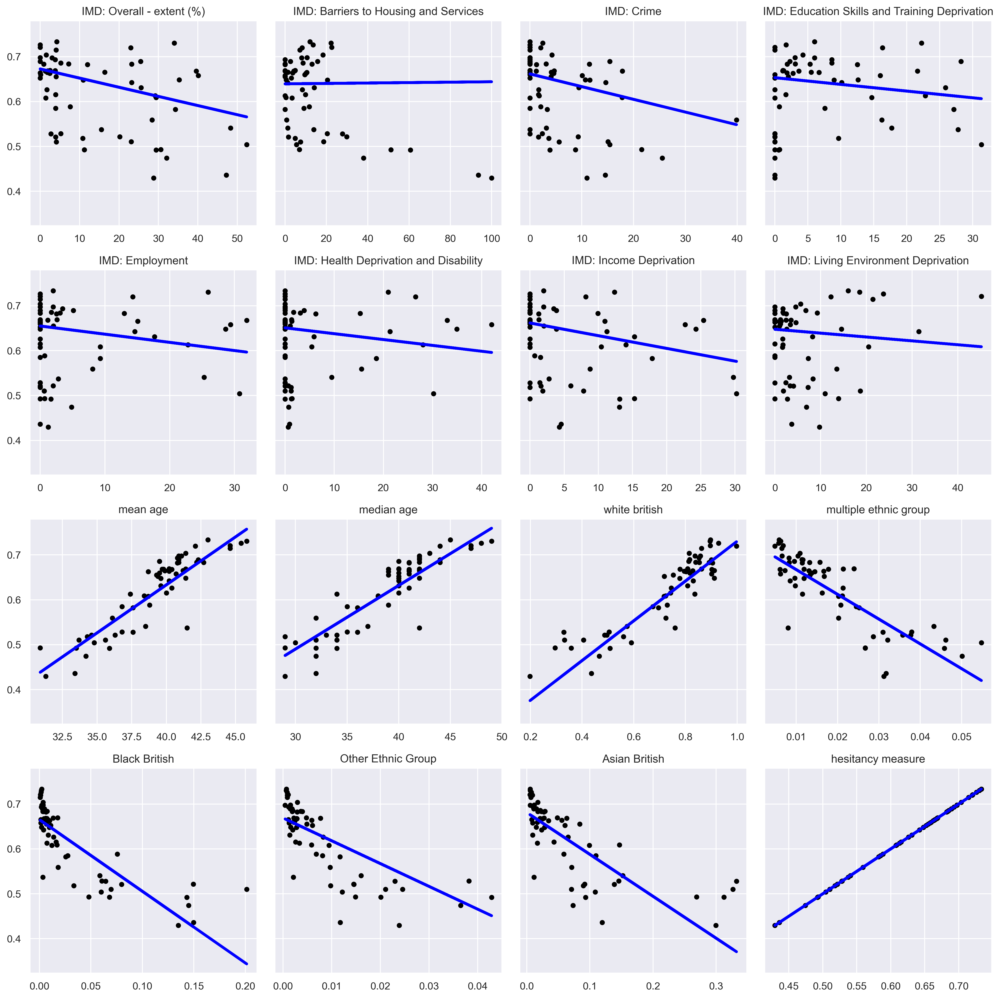

(None, None)

In [30]:
# perform linear regression on each IMD metric individually and plot
# outcome variable being the hesitancy measure calculated previously
rows,cols=4,4
title = '6.09. Linear Regression of the Hesitancy Measure and IMD Metrics'

fig, axes = plt.subplots(figsize=(15,15),nrows=rows, ncols=cols, sharey=True)

N=0

for i in range(rows):
    for j in range(cols):    
        # Load the dataset
        X,y = imd_hesitancy_age_ethnicity_df.iloc[:,N],imd_hesitancy_age_ethnicity_df.iloc[:,-1]

        # Split the dataset into training, validation and test, using test_size=0.2
        Xtrain, Xtest, ytrain, ytest = train_test_split(X.values, y.values, test_size=0.2, random_state=0)
        regr = linear_model.LinearRegression()

        # Train the model using the training sets
        Xtrain,Xtest = Xtrain.reshape(-1, 1),Xtest.reshape(-1, 1)
        regr.fit(Xtrain, ytrain)

        # Make predictions using the testing set
        pred = regr.predict(Xtest)

        # The coefficients
        #print('Coefficients: \n', regr.coef_)
        
        print(imd_hesitancy_age_ethnicity_df.iloc[:,N].name)
        
        # The mean squared error
        print('Mean squared error: %.4f'
              % mean_squared_error(ytest, pred))

        # The coefficient of determination: 1 is perfect prediction
        print('Coefficient of determination: %.2f'
              % r2_score(ytest, pred))
        
        # Plot outputs
        axes[i][j].scatter(Xtest, ytest,  color='black', s=20)
        axes[i][j].plot(Xtest, pred, color='blue', linewidth=3)
        axes[i][j].set_title(imd_hesitancy_age_ethnicity_df.iloc[:,N].name)
        
        N+=1
        
#fig.suptitle(title)
plt.savefig('./Desktop/MSc Project/Outputs/' + title + '.png')
plt.tight_layout(),plt.show()

# Multiple Regression Models [Hesitancy Measure]

In [31]:
# perform multiple linear regression on all IMD metrics
# outcome variable being the hesitancy measure calculated previously
target = 'hesitancy measure'
overall = 'IMD: Overall - extent (%)'

# Load the dataset

# X contains the all input variables divided by LTLA
X = imd_hesitancy_age_ethnicity_df.drop([target,overall],axis=1)

# y contains the hesitancy divided by LTLA
y = imd_hesitancy_age_ethnicity_df[target]

In [32]:
#UPDATE: apply z-score to X so that we can compare the model coefficients and therefore compare 'importance'
X_z = X.apply(stats.zscore)

In [33]:
# Split the dataset into training, validation and test, using test_size=0.2
Xtrain, Xtest, ytrain, ytest = train_test_split(X_z.values, y.values, test_size=0.2, random_state=0)
regr = linear_model.LinearRegression()

In [34]:
# Train the model using the training sets
model = regr.fit(Xtrain, ytrain)

In [35]:
# Make predictions using the testing set
pred = regr.predict(Xtest)

In [36]:
# model coefficients
model.coef_

array([ 0.00260111, -0.00301287, -0.00375534, -0.01439996,  0.00303974,
        0.00075109, -0.00142728,  0.01871049,  0.00374127,  0.04157925,
       -0.00910465,  0.00287598, -0.00360952,  0.00473544])

In [37]:
# model intercept
model.intercept_

0.6346699302988671

In [38]:
#  'r2_score is the (coefficient of determination) regression score function.
# Best possible score is 1.0 and it can be negative (because the model can be arbitrarily worse). A constant model 
# that always predicts the expected value of y, disregarding the input features, would get a score of 0.0.'
r2_score(ytest,pred)

0.9030998181747448

In [39]:
# list of IMD metric column names and the standardised multiple regression model coefficients
multi_regr_standard_coefs_ = list(zip(X_z.columns,model.coef_))

In [40]:
# sort them from largest to smallest
multi_regr_standard_coefs_.sort(key=lambda x: x[1])

In [41]:
# double check
multi_regr_standard_coefs_

[('IMD: Employment', -0.014399956188563136),
 ('multiple ethnic group', -0.00910464570080689),
 ('IMD: Education Skills and Training Deprivation', -0.0037553374918496353),
 ('Other Ethnic Group', -0.0036095202897795846),
 ('IMD: Crime', -0.0030128685579638667),
 ('IMD: Living Environment Deprivation', -0.0014272837333809236),
 ('IMD: Income Deprivation', 0.0007510887163728996),
 ('IMD: Barriers to Housing and Services', 0.002601108390503271),
 ('Black British', 0.0028759787594760163),
 ('IMD: Health Deprivation and Disability', 0.003039735735134874),
 ('median age', 0.003741270542153752),
 ('Asian British', 0.004735440374020055),
 ('mean age', 0.018710491836015034),
 ('white british', 0.041579251681948044)]

In [42]:
# only IMD coefficients
IMD_multi_regr_standard_coefs_ = [i for i in multi_regr_standard_coefs_ if i[0].startswith('IMD')]

In [43]:
# double check
IMD_multi_regr_standard_coefs_

[('IMD: Employment', -0.014399956188563136),
 ('IMD: Education Skills and Training Deprivation', -0.0037553374918496353),
 ('IMD: Crime', -0.0030128685579638667),
 ('IMD: Living Environment Deprivation', -0.0014272837333809236),
 ('IMD: Income Deprivation', 0.0007510887163728996),
 ('IMD: Barriers to Housing and Services', 0.002601108390503271),
 ('IMD: Health Deprivation and Disability', 0.003039735735134874)]

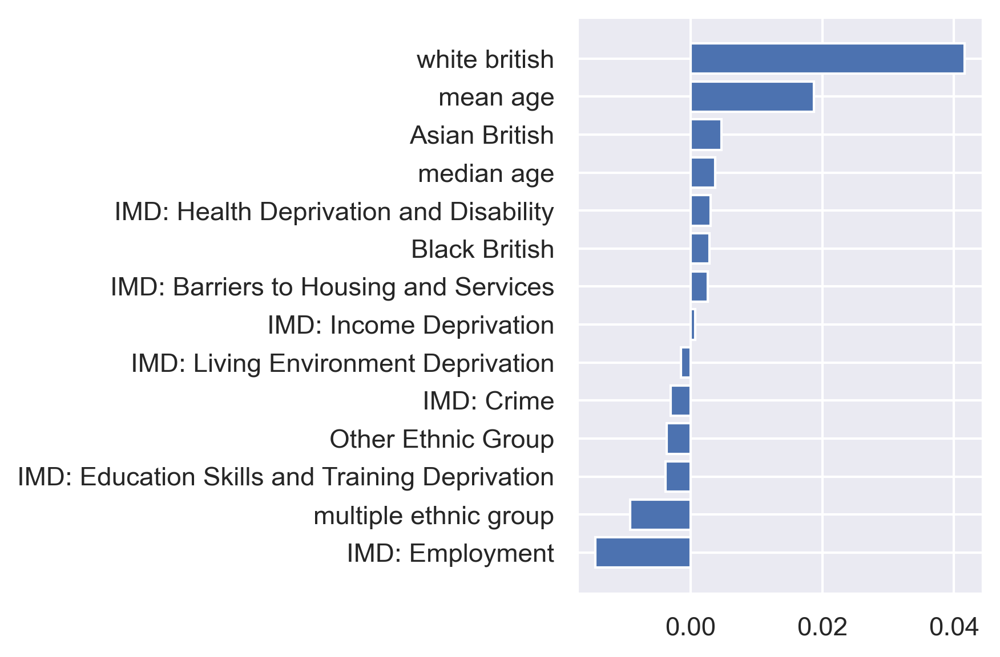

In [44]:
# plot coefficients
title = '6.09. Multiple Linear Regression Model with Hesitancy Measure. How \'important\' is each variable'

plt.barh([tup[0] for tup in multi_regr_standard_coefs_],[tup[1] for tup in multi_regr_standard_coefs_])

#plt.title(title)
plt.tight_layout()
plt.savefig('./Desktop/MSc Project/Outputs/' + title + '.png')
plt.show()

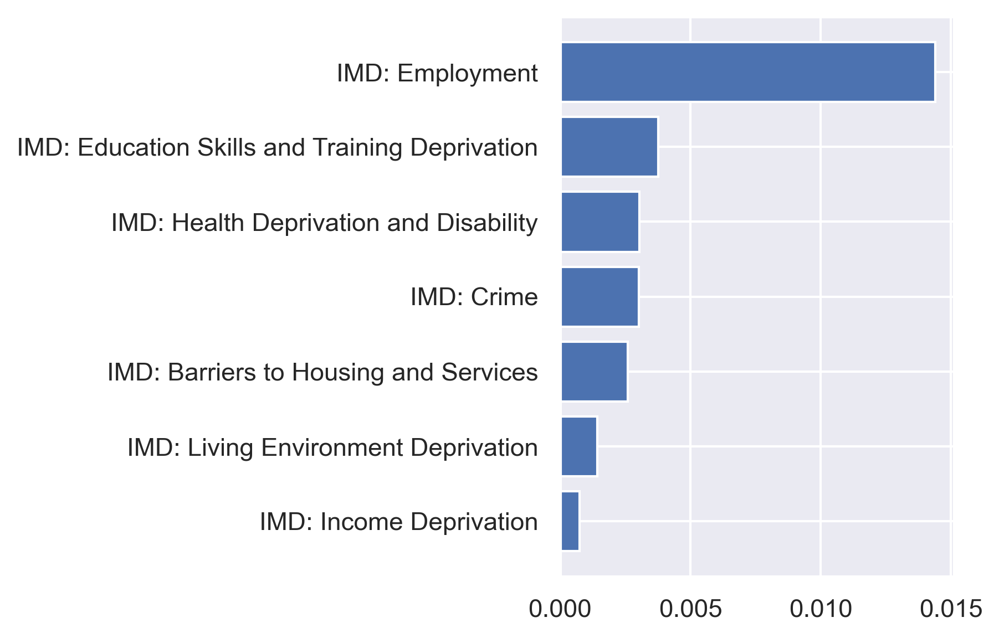

In [45]:
# plot coefficients
title = '6.09. Multiple Linear Regression Model with Hesitancy Measure. How \'important\' is each IMD Metric'

# absolute values of only IMD coefficients
test = [(tup[0],abs(tup[1])) for tup in IMD_multi_regr_standard_coefs_]

# sort them from largest to smallest
test.sort(key=lambda x: x[1])

# plot only IMD coefficients
plt.barh([tup[0] for tup in test],[tup[1] for tup in test])

#plt.title(title)
plt.tight_layout()
plt.savefig('./Desktop/MSc Project/Outputs/' + title + '.png')
plt.show()

# Generalised Linear Regression Models [Hesitancy Measure]

### Load and split the data

In [46]:
# get data
X = X_z # the standardised input metrics
y = imd_hesitancy_age_ethnicity_df['hesitancy measure'] #the hesitancy measure calculated early

In [47]:
# Split the dataset into training, validation and test, using test_size=0.2
Xtrain, Xtest, ytrain, ytest = train_test_split(X.values, y.values, test_size=0.4, random_state=0)
Xval, Xtest, yval, ytest = train_test_split(Xtest, ytest, test_size=0.5, random_state=0)

### Initial model train and results

In [48]:
# instantiate the model
regr = TweedieRegressor(power=10, alpha=0.5, link='auto')

# fit model of training data
regr.fit(Xtrain, ytrain)

TweedieRegressor(alpha=0.5, power=10)

In [49]:
# Make predictions using the testing set
pred = regr.predict(Xtest)

In [50]:
# coeficients of model after using only train and test sets
regr.coef_

array([-0.00781062, -0.00264876, -0.00171817, -0.03509143,  0.01908118,
       -0.00531144, -0.00794156,  0.03093965,  0.00919002,  0.07047927,
       -0.01843872,  0.01974887, -0.0068341 ,  0.01512675])

In [51]:
# intercept of model after using only train and test sets
regr.intercept_

-0.460946360062454

In [52]:
# number of iterations of model after using only train and test sets
regr.n_iter_

51

In [53]:
# 'r2_score is the (coefficient of determination) regression score function.
# Best possible score is 1.0 and it can be negative (because the model can be arbitrarily worse). A constant model 
# that always predicts the expected value of y, disregarding the input features, would get a score of 0.0.'
r2_score(ytest,pred)

0.9029236726101284

In [54]:
# list of IMD metric column names and the standardised multiple regression model coefficients
gen_regr_standard_coefs_ = list(zip(X_z.columns,regr.coef_))

In [55]:
# sort them from largest to smallest
gen_regr_standard_coefs_.sort(key=lambda x: x[1])

In [56]:
# double check
gen_regr_standard_coefs_

[('IMD: Employment', -0.03509142859994041),
 ('multiple ethnic group', -0.01843872153941497),
 ('IMD: Living Environment Deprivation', -0.007941560135712835),
 ('IMD: Barriers to Housing and Services', -0.007810624047043159),
 ('Other Ethnic Group', -0.006834104887254902),
 ('IMD: Income Deprivation', -0.005311442991079942),
 ('IMD: Crime', -0.002648758964876267),
 ('IMD: Education Skills and Training Deprivation', -0.0017181704256295743),
 ('median age', 0.009190019144604508),
 ('Asian British', 0.015126748633213994),
 ('IMD: Health Deprivation and Disability', 0.019081180531933674),
 ('Black British', 0.019748874050661808),
 ('mean age', 0.030939652708474843),
 ('white british', 0.07047927495997541)]

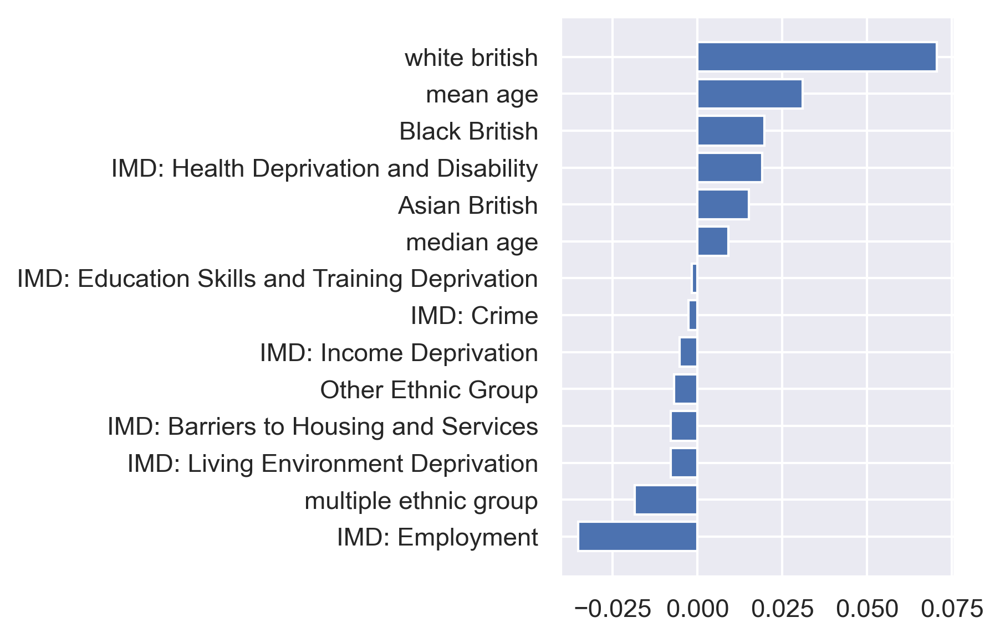

In [57]:
# plot coefficients
title = '6.09. General Linear Regression Model with Hesitancy Measure. How \'important\' is each variable'

plt.barh([tup[0] for tup in gen_regr_standard_coefs_],[tup[1] for tup in gen_regr_standard_coefs_])

#plt.title(title)
plt.tight_layout()
plt.savefig('./Desktop/MSc Project/Outputs/' + title + '.png')
plt.show()

In [58]:
# only IMD coefficients
IMD_glm_coefs_ = [i for i in gen_regr_standard_coefs_ if i[0].startswith('IMD')]

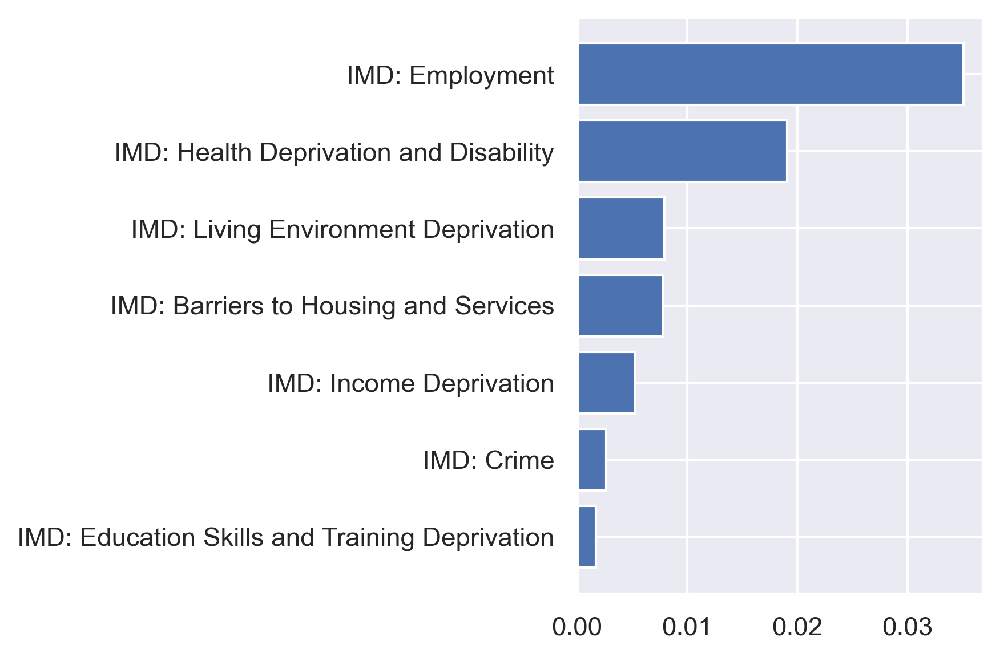

In [59]:
# plot coefficients
title = '6.09. General Linear Regression Model with Hesitancy Measure. How \'important\' is each IMD Metric'

# absolute values of only IMD coefficients
test = [(tup[0],abs(tup[1])) for tup in IMD_glm_coefs_]

# sort them from largest to smallest
test.sort(key=lambda x: x[1])

# plot only IMD coefficients
plt.barh([tup[0] for tup in test],[tup[1] for tup in test])

#plt.title(title)
plt.tight_layout()
plt.savefig('./Desktop/MSc Project/Outputs/' + title + '.png')
plt.show()

---

## Tuning hyperparameters

##### 'Best' power value, p, in TweedieRegressor (i.e. what is the underlying target distribution according)?

In [60]:
# make predictions and accuracy scores using the validation set on different power values, p, within TweedieRegressor
power_values = list(np.linspace(1,11,101))
power_values.insert(0,0.0)
power_values_r2_scores = []

for p in power_values:
    # instantiate the model
    regr = TweedieRegressor(power=p, alpha=0.5, link='auto')

    # fit using the training data
    regr.fit(Xtrain, ytrain)

    # make predictions using the validation set
    pred = regr.predict(Xval)
    
    # calculate and store the r2_score for each values of p
    acc = r2_score(yval,pred)
    power_values_r2_scores.append((p,acc))

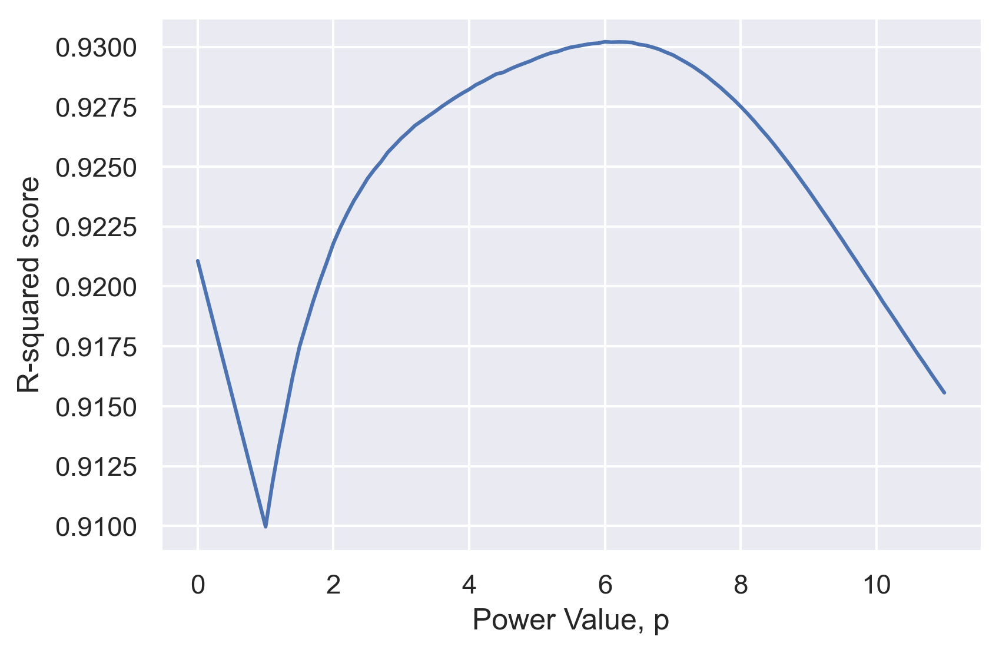

In [61]:
# plot hyperparamter tuning
title = '6.09. Which power value gives the highest R-squared accuracy score'

# plot the model's R-squared scores for different power values, p?
plt.plot([tup[0] for tup in power_values_r2_scores],[tup[1] for tup in power_values_r2_scores])
plt.xlabel('Power Value, p')
plt.ylabel('R-squared score')

#plt.title(title)
plt.savefig('./Desktop/MSc Project/Outputs/' + title + '1.png')
plt.show()

In [62]:
# what power values, p, gives the maximum R-squared score?
max(power_values_r2_scores, key=lambda x:x[1])

(6.0, 0.9302114709427853)

In [63]:
# SAME AS ABOVE BUT A SMALLER RANGE OF P VALUES

# make predictions and accuracy scores using the validation set on different power values, p, within TweedieRegressor
power_values = list(np.linspace(1,7,601))
power_values_r2_scores = []

for p in power_values:
    # instantiate the model
    regr = TweedieRegressor(power=p, alpha=0.5, link='auto')

    # fit using the training data
    regr.fit(Xtrain, ytrain)

    # make predictions using the validation set
    pred = regr.predict(Xval)
    
    # calculate and store the r2_score for each values of p
    acc = r2_score(yval,pred)
    power_values_r2_scores.append((p,acc))

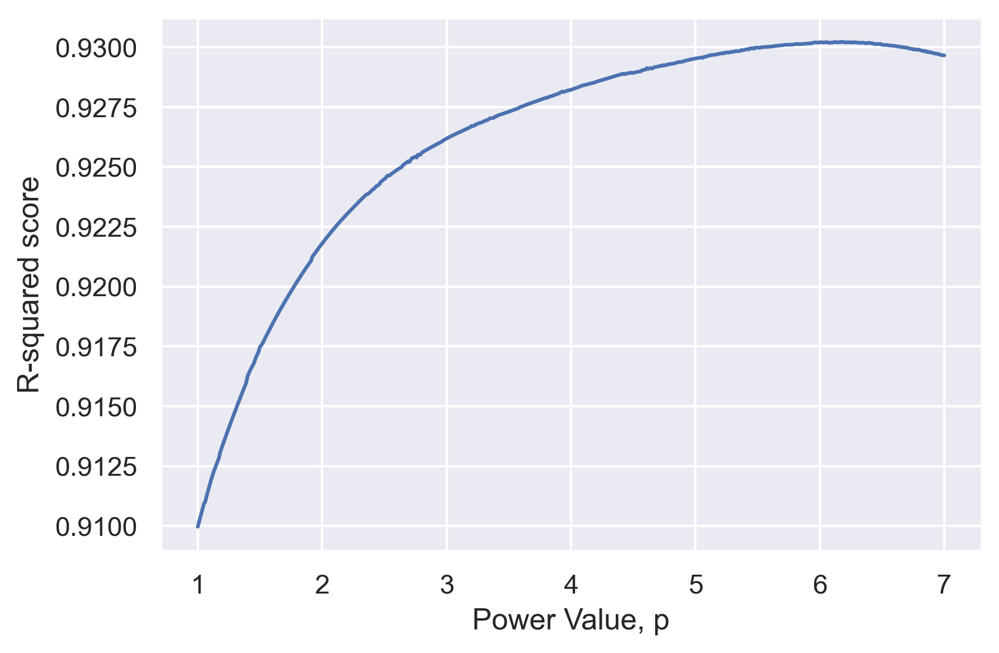

In [64]:
# plot hyperparamter tuning
title = '6.09. Which power value gives the highest R-squared accuracy score'

# plot the model's R-squared scores for different power values, p?
plt.plot([tup[0] for tup in power_values_r2_scores],[tup[1] for tup in power_values_r2_scores])
plt.xlabel('Power Value, p')
plt.ylabel('R-squared score')

#plt.title(title)
plt.savefig('./Desktop/MSc Project/Outputs/' + title + '2.png')
plt.show()

In [65]:
# what power values, p, gives the maximum R-squared score?
max(power_values_r2_scores, key=lambda x:x[1])

(6.18, 0.9302291778414336)

Seems like the best power value is p=4.21

### accuracy on the test set

In [66]:
p=max(power_values_r2_scores, key=lambda x:x[1])[0]

In [67]:
# instantiate the model
regr = TweedieRegressor(power=p, alpha=0.5, link='auto')

# fit using the training data
regr.fit(Xtrain, ytrain)

# make predictions using the test set
pred = regr.predict(Xtest)
    
# calculate and store the r2_score for each values of p
acc = r2_score(ytest,pred)

print('R squared accuracy on test set with power value =', p, 'is', acc)

R squared accuracy on test set with power value = 6.18 is 0.9057247664948619


##### 'Best' alpha value, a, in TweedieRegressor (i.e. the constant that multiplies the penalty term and thus determines the regularization strength.)?

In [68]:
# make predictions and accuracy scores using the validation set on different alpha values, a, within TweedieRegressor
alpha_values = list(np.linspace(0,10,101))
alpha_values_r2_scores = []

for a in alpha_values:
    # instantiate the model
    regr = TweedieRegressor(power=p, alpha=a, link='auto')

    # fit using the training data
    regr.fit(Xtrain, ytrain)

    # make predictions using the validation set
    pred = regr.predict(Xval)
    
    # calculate and store the r2_score for each values of p
    acc = r2_score(yval,pred)
    alpha_values_r2_scores.append((a,acc))

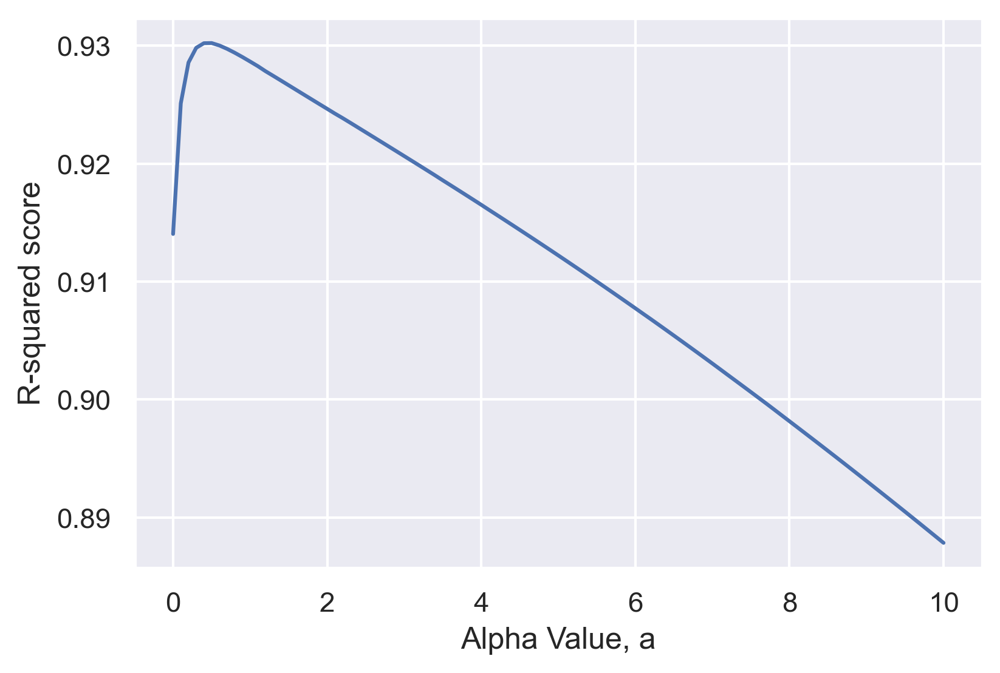

In [69]:
# plot hyperparamter tuning
title = '6.09. Which alpha value gives the highest R-squared accuracy score'

# plot the model's R-squared scores for different alpha values, a?
plt.plot([tup[0] for tup in alpha_values_r2_scores],[tup[1] for tup in alpha_values_r2_scores])
plt.xlabel('Alpha Value, a')
plt.ylabel('R-squared score')

#plt.title(title)
plt.savefig('./Desktop/MSc Project/Outputs/' + title + '1.png')
plt.show()

In [70]:
# what alpha values, a, gives the maximum R-squared score?
max(alpha_values_r2_scores, key=lambda x:x[1])

(0.5, 0.9302291778414336)

In [71]:
# SAME AS ABOVE BUT A SMALLER RANGE OF ALPHA VALUES

# make predictions and accuracy scores using the validation set on different alpha values, a, within TweedieRegressor
alpha_values = list(np.linspace(0,1,101))
alpha_values_r2_scores = []

for a in alpha_values:
    # instantiate the model
    regr = TweedieRegressor(power=p, alpha=a, link='auto')

    # fit using the training data
    regr.fit(Xtrain, ytrain)

    # make predictions using the validation set
    pred = regr.predict(Xval)
    
    # calculate and store the r2_score for each values of p
    acc = r2_score(yval,pred)
    alpha_values_r2_scores.append((a,acc))

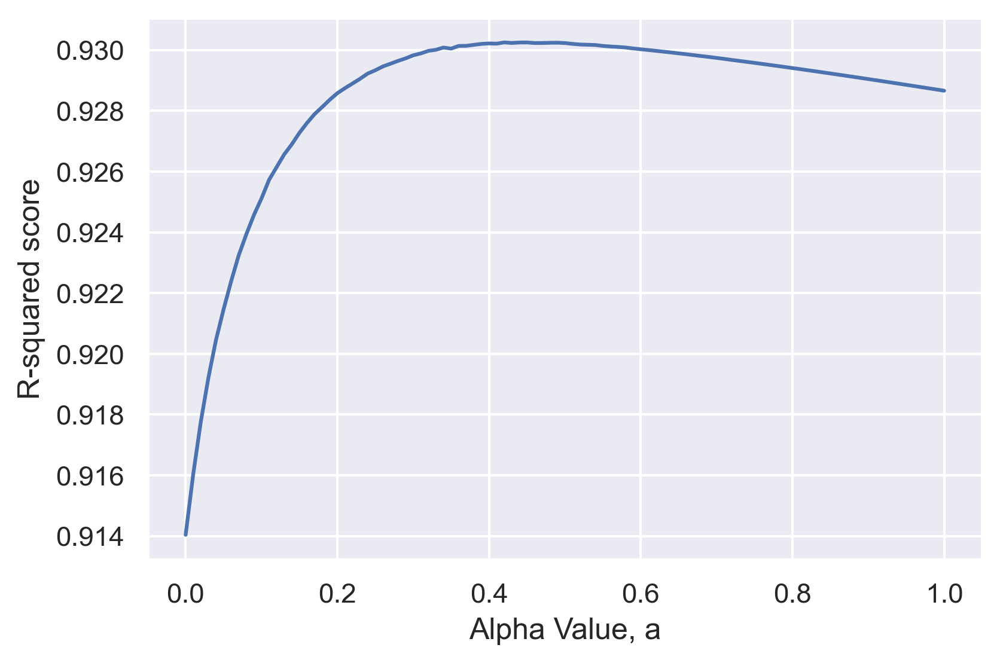

In [72]:
# plot hyperparamter tuning
title = '6.09. Which alpha value gives the highest R-squared accuracy score'

# plot the model's R-squared scores for different alpha values, a?
plt.plot([tup[0] for tup in alpha_values_r2_scores],[tup[1] for tup in alpha_values_r2_scores])
plt.xlabel('Alpha Value, a')
plt.ylabel('R-squared score')

#plt.title(title)
plt.savefig('./Desktop/MSc Project/Outputs/' + title + '2.png')
plt.show()

In [73]:
# what alpha values, a, gives the maximum R-squared score?
max(alpha_values_r2_scores, key=lambda x:x[1])

(0.42, 0.930249879535997)

Seems like the best alpha value is a=0.2

### accuracy on the test set

In [74]:
a=max(alpha_values_r2_scores, key=lambda x:x[1])[0]

In [75]:
# instantiate the model
regr = TweedieRegressor(power=4.21, alpha=a, link='auto')

# fit using the training data
regr.fit(Xtrain, ytrain)

# make predictions using the test set
pred = regr.predict(Xtest)
    
# calculate and store the r2_score for each values of p
acc = r2_score(ytest,pred)

print('R squared accuracy on test set with alpha value =', a, 'is', acc)

R squared accuracy on test set with alpha value = 0.42 is 0.9029780037164492


### Model after hyperparameter tuning

In [76]:
# instantiate the model
regr = TweedieRegressor(power=p, alpha=a, link='auto')

# fit using the training data
regr.fit(Xtrain, ytrain)

# make predictions using the test set
pred = regr.predict(Xtest)

In [77]:
#  'r2_score is the (coefficient of determination) regression score function.
# Best possible score is 1.0 and it can be negative (because the model can be arbitrarily worse). A constant model 
# that always predicts the expected value of y, disregarding the input features, would get a score of 0.0.'
acc = r2_score(ytest,pred)
acc

0.9063098400491196

In [78]:
# list of IMD metric column names and the standardised multiple regression model coefficients
multi_regr_standard_coefs_ = list(zip(X_z.columns,regr.coef_))

In [79]:
# sort them from largest to smallest
multi_regr_standard_coefs_.sort(key=lambda x: x[1])

In [80]:
# double check
multi_regr_standard_coefs_

[('IMD: Employment', -0.016907733258712004),
 ('multiple ethnic group', -0.016784027140765757),
 ('Other Ethnic Group', -0.013579850799687768),
 ('IMD: Crime', -0.005029141850163874),
 ('IMD: Income Deprivation', -0.004871084483902069),
 ('IMD: Living Environment Deprivation', -0.004414506291368722),
 ('IMD: Barriers to Housing and Services', -0.002846844828221772),
 ('Asian British', -0.0026275822188807567),
 ('IMD: Education Skills and Training Deprivation', -0.002064224748521132),
 ('Black British', 0.0038109602581849165),
 ('IMD: Health Deprivation and Disability', 0.004255553263648065),
 ('median age', 0.017423046576205383),
 ('mean age', 0.021031606462108568),
 ('white british', 0.04087089668385309)]

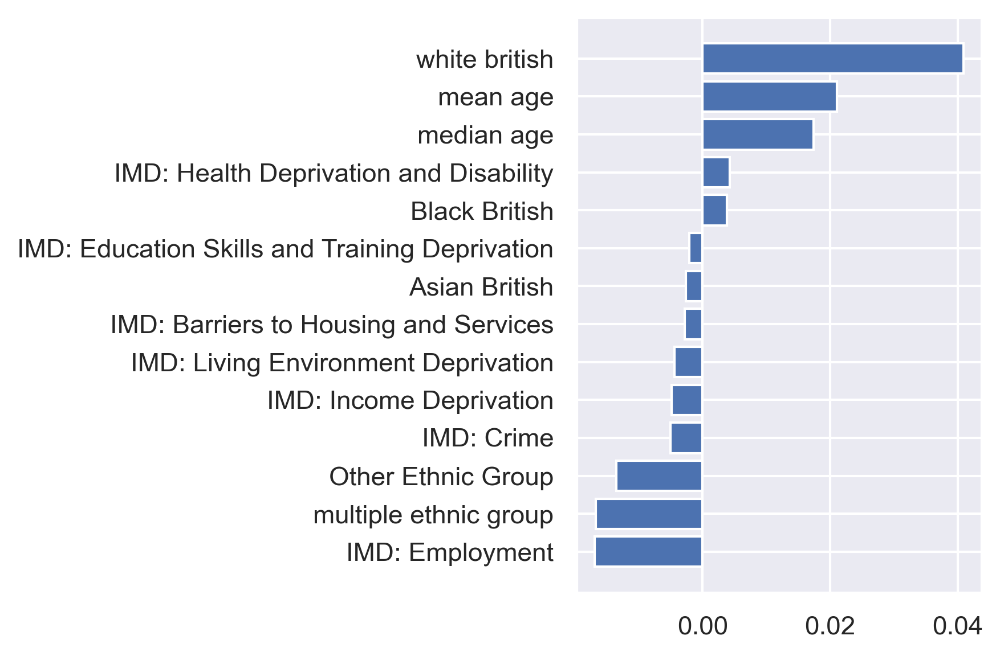

In [81]:
# plot coefficients
title = '6.09. General Linear Regression Model after hyperparameter tuning. How \'important\' is each variable'

# plot coefficients
plt.barh([tup[0] for tup in multi_regr_standard_coefs_],[tup[1] for tup in multi_regr_standard_coefs_])

#plt.title(title)
plt.tight_layout()
plt.savefig('./Desktop/MSc Project/Outputs/' + title + '.png')
plt.show()

In [82]:
# only the IMD coefficients
IMD_glm_coefs_ = [i for i in multi_regr_standard_coefs_ if i[0].startswith('IMD')]

In [83]:
# double check
IMD_glm_coefs_

[('IMD: Employment', -0.016907733258712004),
 ('IMD: Crime', -0.005029141850163874),
 ('IMD: Income Deprivation', -0.004871084483902069),
 ('IMD: Living Environment Deprivation', -0.004414506291368722),
 ('IMD: Barriers to Housing and Services', -0.002846844828221772),
 ('IMD: Education Skills and Training Deprivation', -0.002064224748521132),
 ('IMD: Health Deprivation and Disability', 0.004255553263648065)]

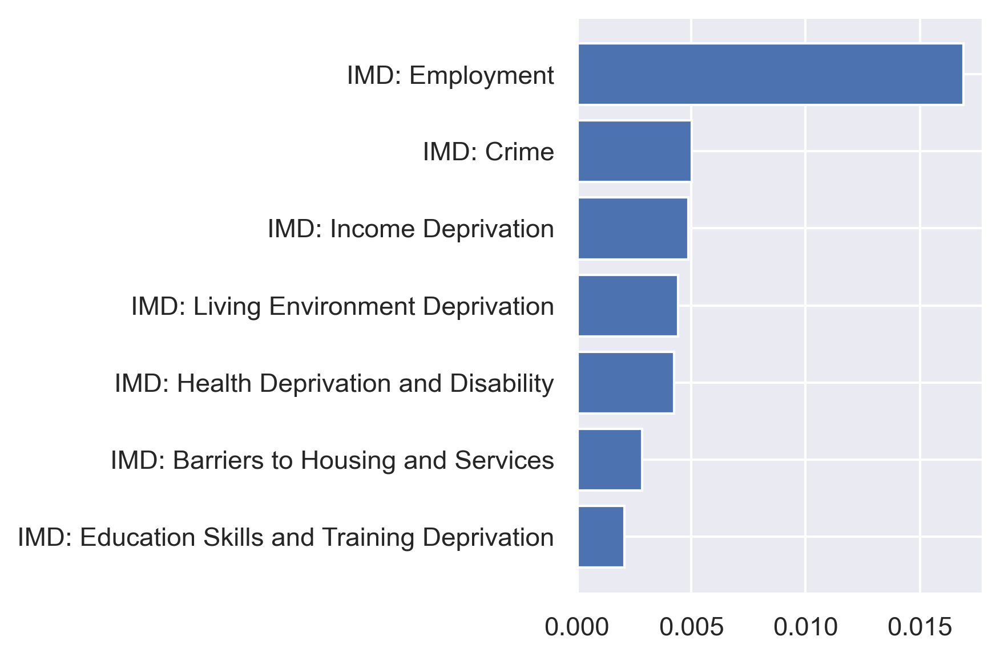

In [84]:
# plot coefficients
title = '6.09. General Linear Regression Model after hyperparameter tuning. How \'important\' is each IMD metric'

# absolute values of only the IMD coefficients
test = [(tup[0],abs(tup[1])) for tup in IMD_glm_coefs_]

# sort them from largest to smallest
test.sort(key=lambda x: x[1])

# plot only IMD coefficients
plt.barh([tup[0] for tup in test],[tup[1] for tup in test])

#plt.title(title)
plt.tight_layout()
plt.savefig('./Desktop/MSc Project/Outputs/' + title + '.png')
plt.show()

In [85]:
print('R squared accuracy on test set with power value =', p, 'and alpha value =', a, 'is', acc)

R squared accuracy on test set with power value = 6.18 and alpha value = 0.42 is 0.9063098400491196


# Linear Mixed Model

We'll create model for each IMD metric compared to the hesitancy measure stratified by region

### Load data and add region names

In [86]:
# load data on LTLA and region names
fp = './Desktop/MSc Project/Data/PHE/Weekly/Full data/34_COVID-19-weekly-announced-vaccinations-19-August-2021.xlsx'

df = pd.read_excel(fp, engine='openpyxl', sheet_name='LTLA', index_col=None, usecols = 'C,G', header = 10)

In [87]:
# remove NaNs, rename columns appropriately and set LATA names as index
df = df.dropna()
df = df.rename(columns= {'Region name (administrative)':'region name','LTLA name4,5':'LTLA name'})
df = df.set_index('LTLA name')

In [88]:
# join our input variables data frame with the ragion names data frames created above
imd_hesitancy_age_ethnicity__region_df = pd.concat([imd_hesitancy_age_ethnicity_df, df], axis=1, join='inner')

In [89]:
# reorder the columns (region name as first column)
imd_hesitancy_age_ethnicity__region_df = imd_hesitancy_age_ethnicity__region_df[['region name'] +
    [col for col in imd_hesitancy_age_ethnicity__region_df if col not in ['region name']]]

### Eperimenting with Seaborn

In [90]:
# apply z-score to our input variables (ignore region name column)
test_imd_hesitancy_age_ethnicity__region_df = imd_hesitancy_age_ethnicity__region_df.iloc[:,1:].apply(stats.zscore)

In [91]:
# join region names and standardised z-score columns back together
test2_imd_hesitancy_age_ethnicity__region_df = pd.concat(
    [imd_hesitancy_age_ethnicity__region_df.iloc[:,0],test_imd_hesitancy_age_ethnicity__region_df],axis=1)
test2_imd_hesitancy_age_ethnicity__region_df.head(2)

,region name,IMD: Overall - extent (%),IMD: Barriers to Housing and Services,IMD: Crime,IMD: Education Skills and Training Deprivation,IMD: Employment,IMD: Health Deprivation and Disability,IMD: Income Deprivation,IMD: Living Environment Deprivation,mean age,median age,white british,multiple ethnic group,Black British,Other Ethnic Group,Asian British,hesitancy measure
Adur,South East,-0.496129,-0.726803,-0.698484,-0.154373,-0.722428,-0.595012,-0.734373,-0.756852,1.016057,0.865564,0.600137,-0.254190,-0.425560,-0.248247,-0.543113,0.774059
Allerdale,North West,0.260766,0.277788,-0.698484,1.046862,0.516033,0.285059,0.266047,1.147729,1.050664,1.094292,1.154695,-1.106898,-0.540775,-0.600150,-0.719615,1.227474


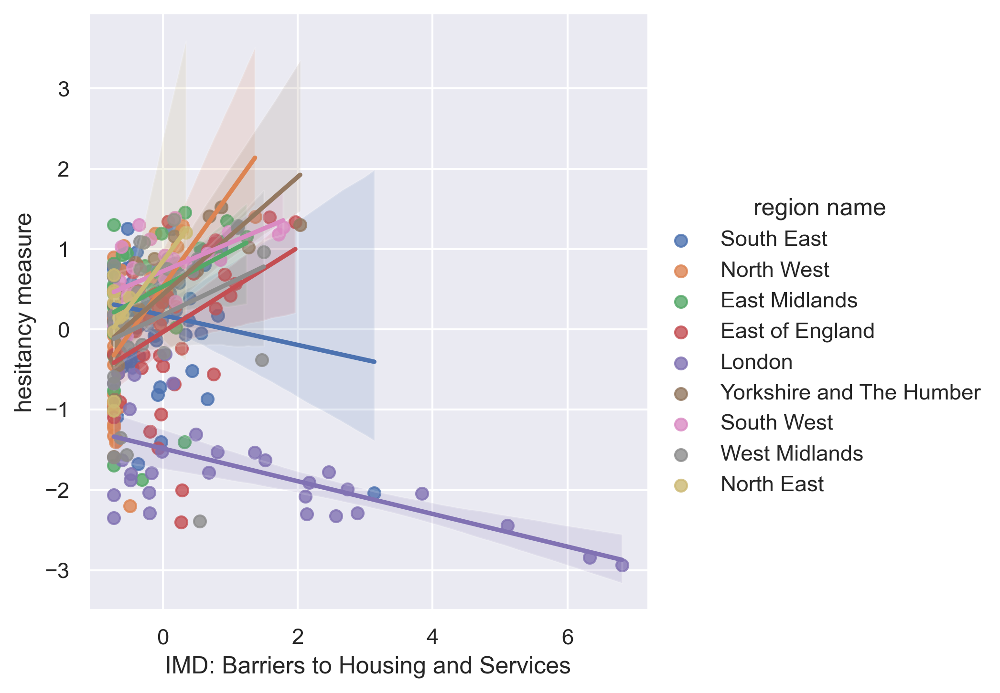

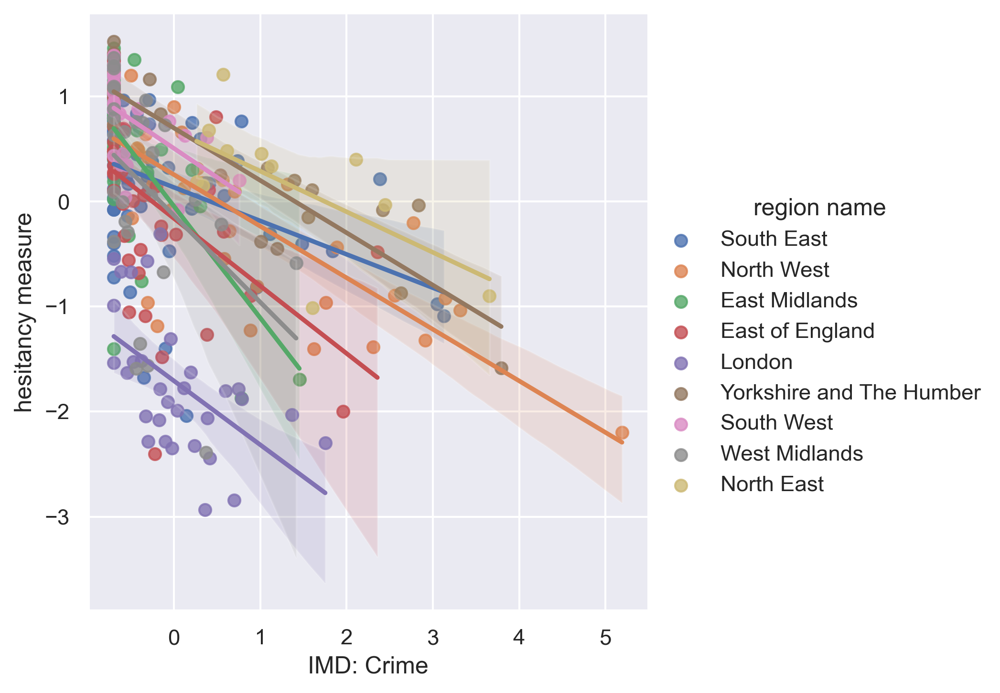

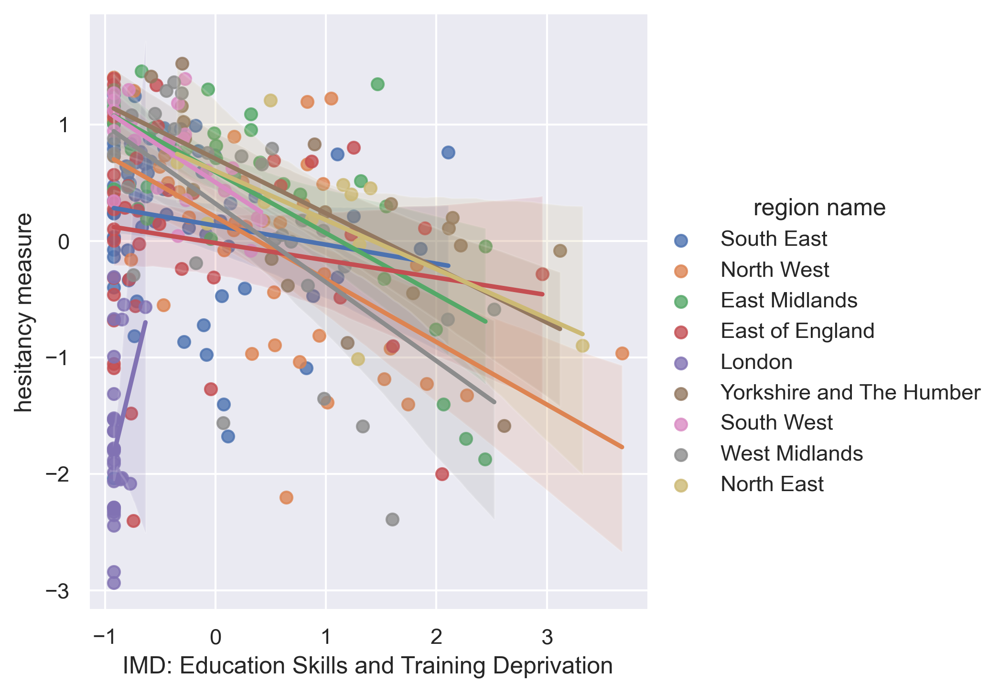

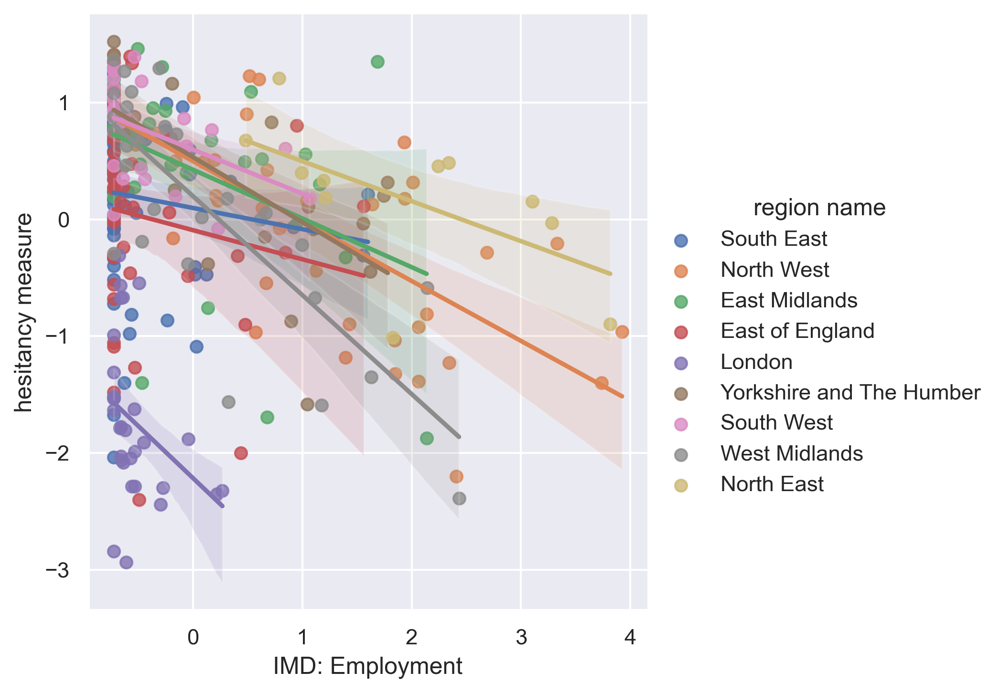

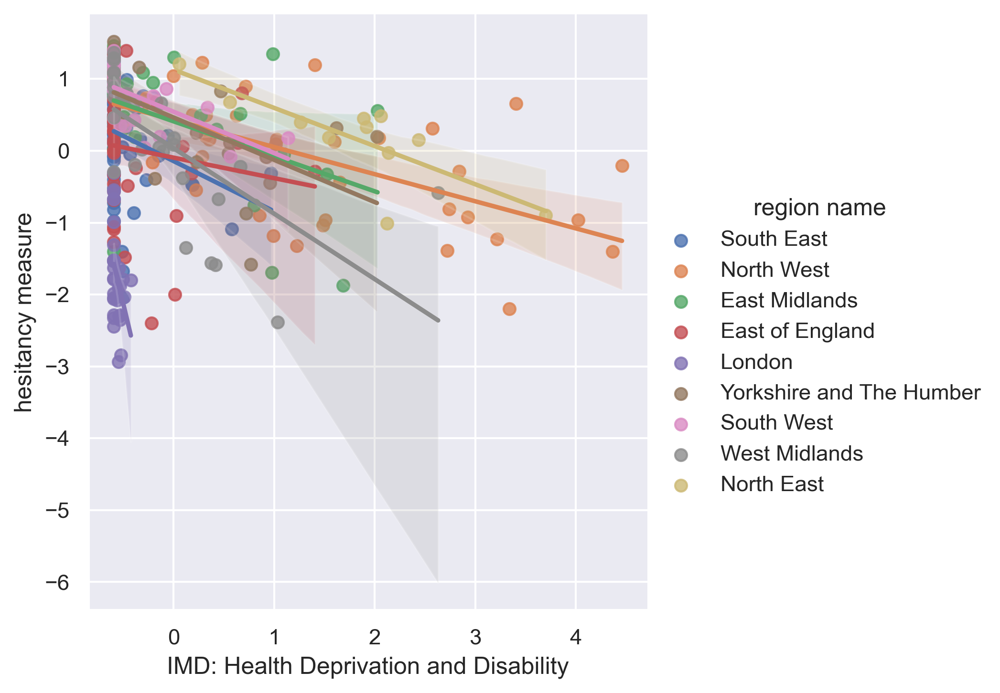

...

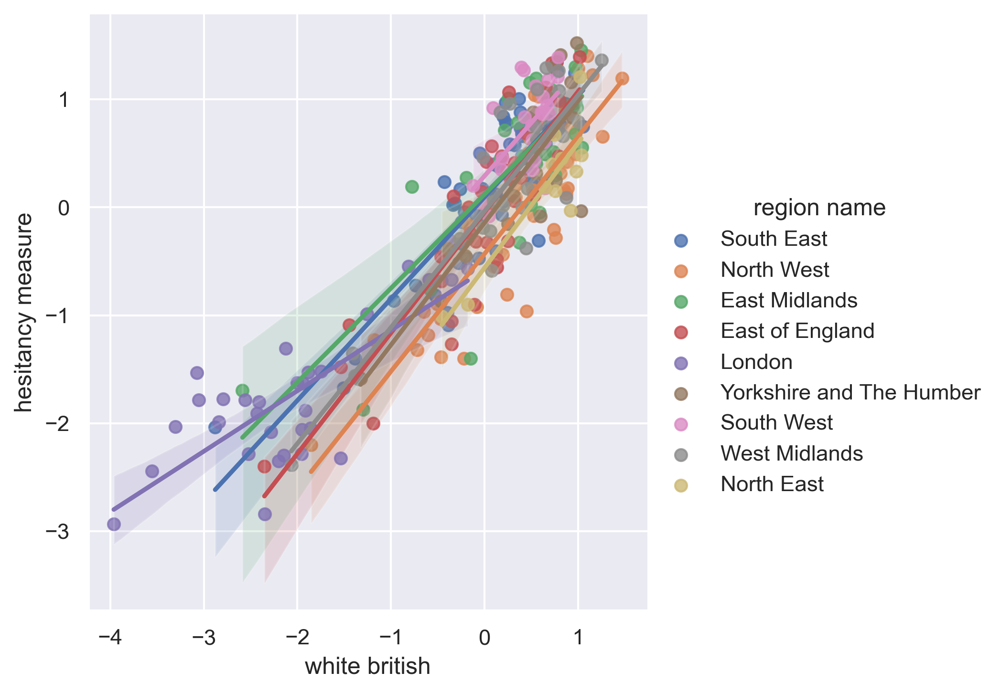

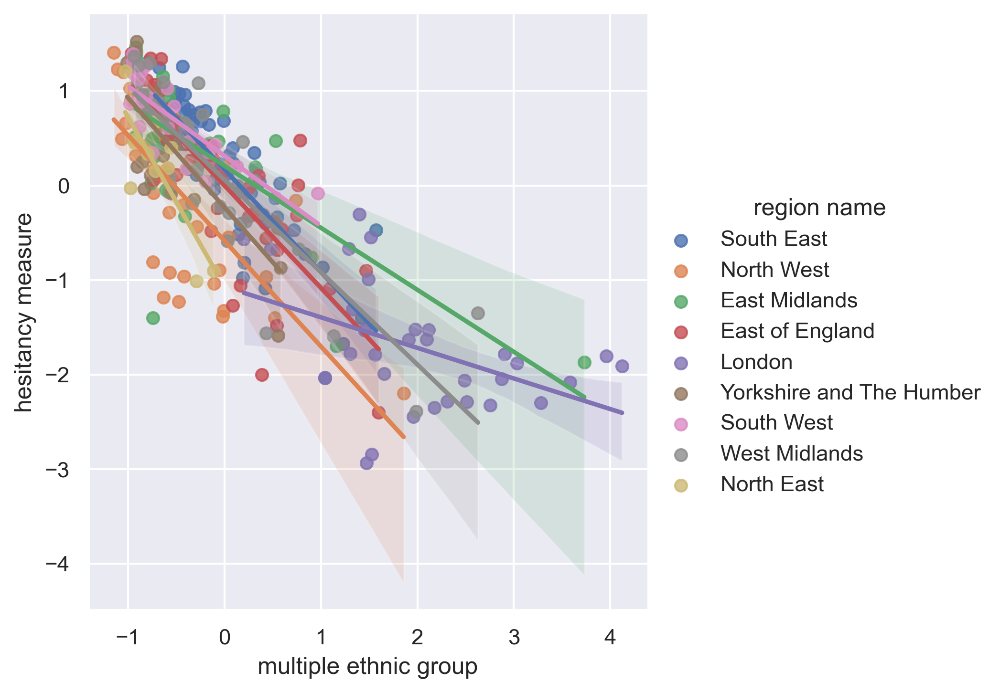

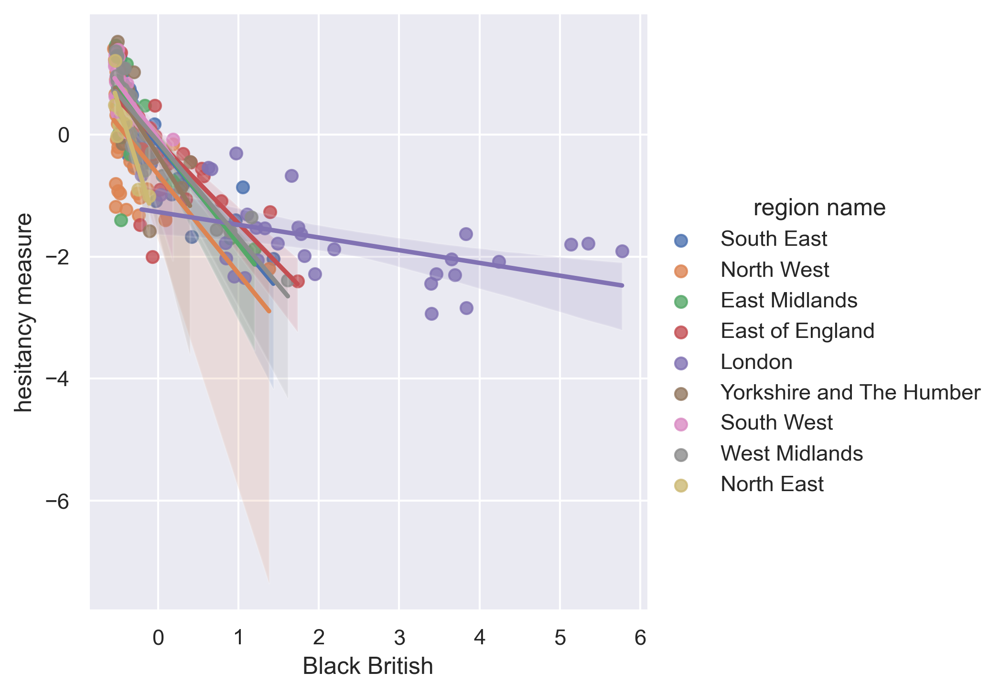

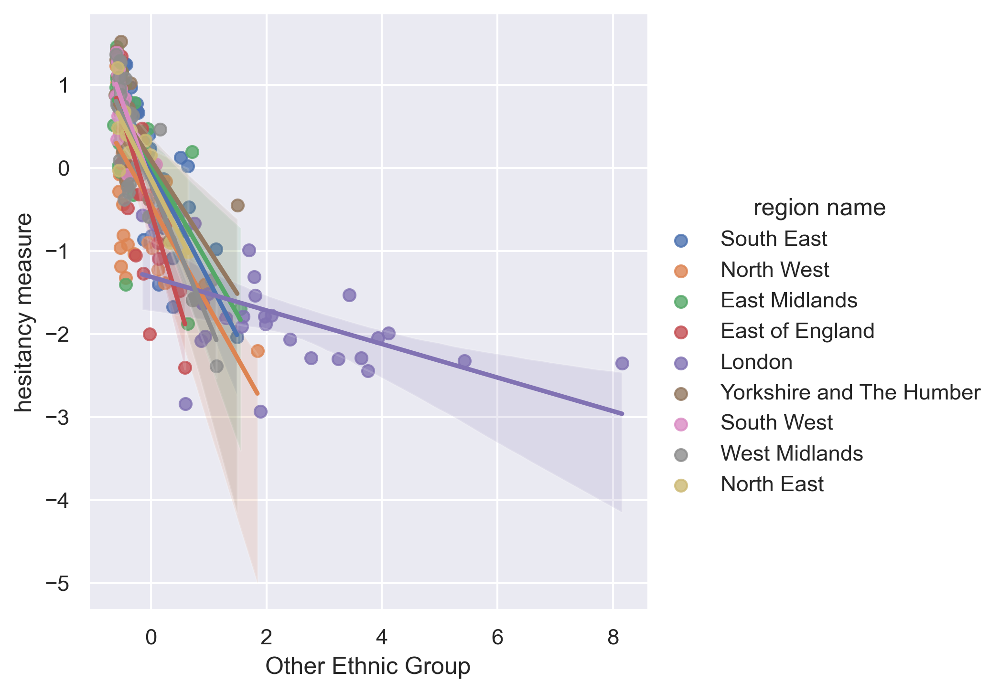

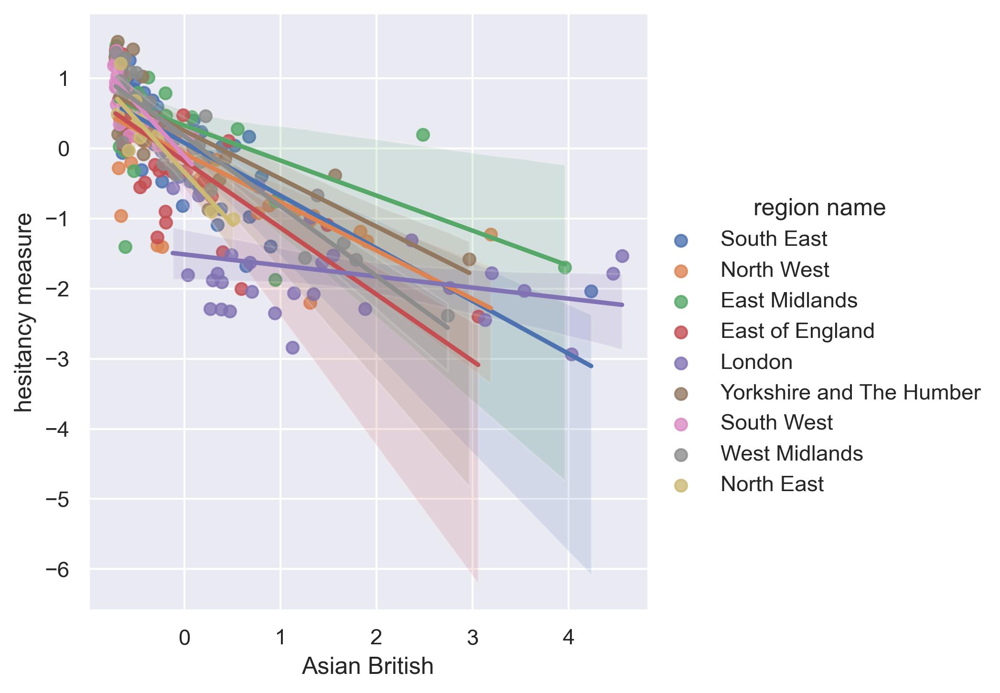

In [92]:
for col in list(test_imd_hesitancy_age_ethnicity__region_df.columns[1:-1]):
    g = sns.lmplot(x = col, 
                   y = 'hesitancy measure', 
                   hue = 'region name',
                   data = test2_imd_hesitancy_age_ethnicity__region_df)

In [93]:
path = './Desktop/MSc Project/Data/'
imd_hesitancy_age_ethnicity__region_df.to_csv(path + 'imd_hesitancy_age_ethnicity__region_df.csv')